In [32]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
# !pip install albumentations

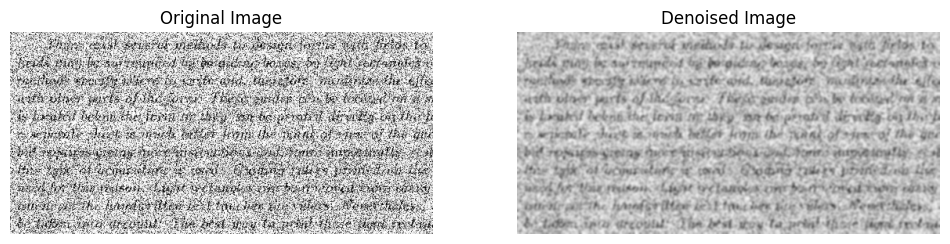

In [36]:
import albumentations as albu
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Define Gaussian Blur for denoising
transform = albu.GaussianBlur(blur_limit=(3, 7), p=1.0)

# Load the image
image_path = 'Images/image6.png'
image = np.array(Image.open(image_path))

# Apply the Gaussian Blur transformation
denoised_image = transform(image=image)['image']

# Display the original and denoised images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(image)
axs[0].set_title("Original Image")
axs[0].axis('off')

# Denoised Image
axs[1].imshow(denoised_image)
axs[1].set_title("Denoised Image")
axs[1].axis('off')

plt.show()


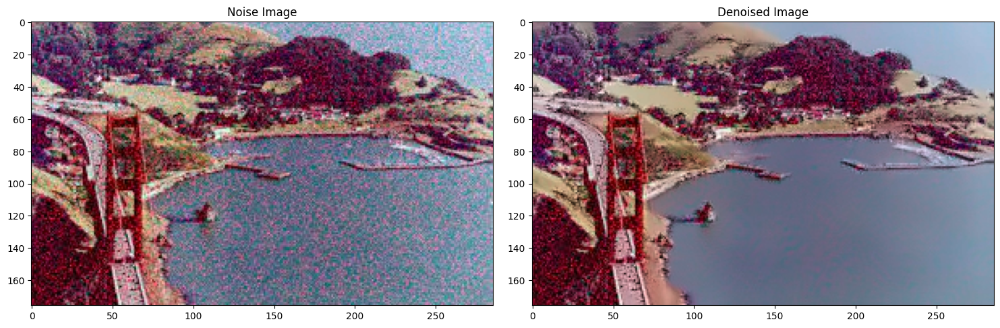

In [34]:
def DenoisingImage(image):
    image_data = cv2.imread(image)
    dst = cv2.fastNlMeansDenoisingColored(image_data, None, 11, 6, 7, 21)
    row, col = 1,2
    fig, axs = plt.subplots(row, col, figsize=(15,10))
    fig.tight_layout()
    axs[0].imshow(cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Noise Image")
    axs[1].imshow(cv2.cvtColor(dst,cv2.COLOR_BGR2RGB))
    axs[1].set_title("Denoised Image")
    # plt.show()

DenoisingImage('Images/image2.jpeg')

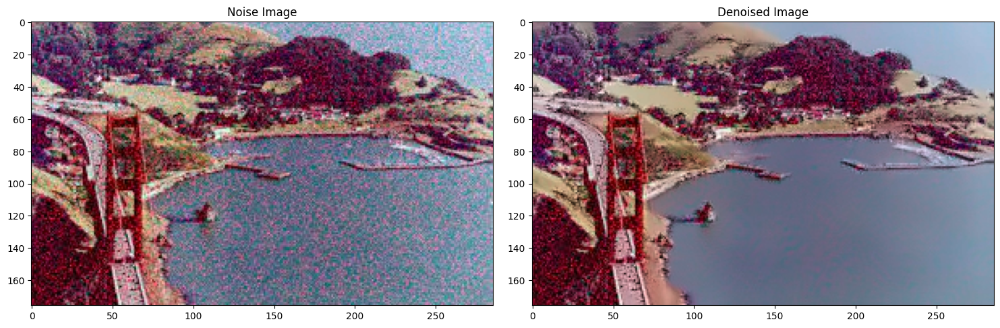

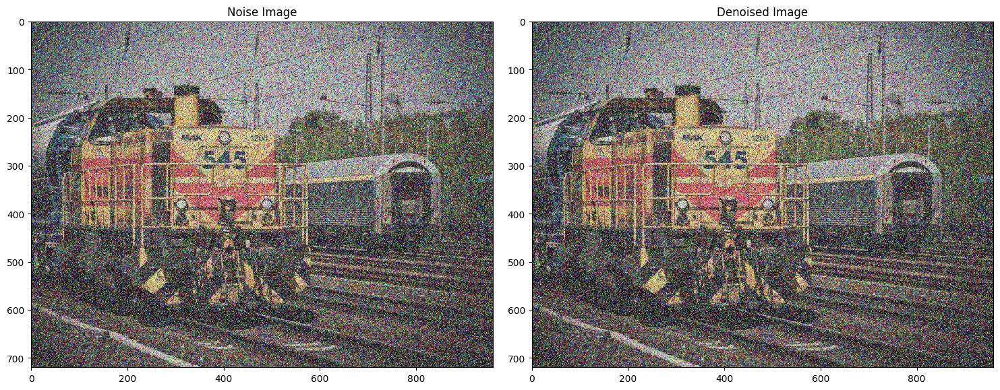

In [16]:
import cv2
import matplotlib.pyplot as plt

image_paths = ['Images/image2.jpeg', 'Images/image1.jpg']

images = [cv2.imread(path) for path in image_paths]

for i, img in enumerate(images):
    if img is None:
        print(f"Error: Unable to load image at path '{image_paths[i]}'")
    else:
        denoised_img = cv2.fastNlMeansDenoisingColored(img, None, 11, 6, 7, 21)
        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()
        
        axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[0].set_title("Noise Image")
        
        axs[1].imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
        axs[1].set_title("Denoised Image")
        
        plt.show()


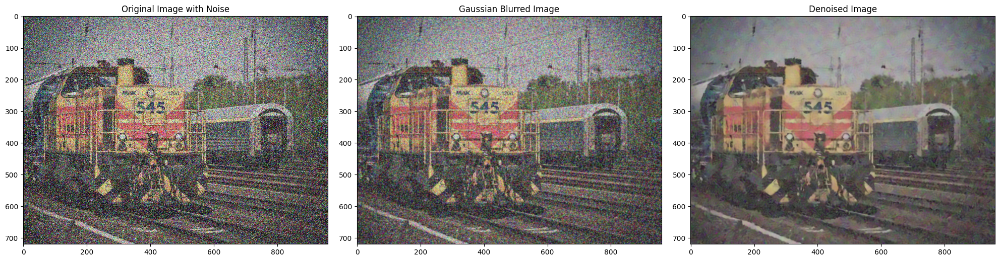

In [30]:
import cv2
import matplotlib.pyplot as plt
def DenoisingImage(image, h=11, hForColorComponents=6, templateWindowSize=7, searchWindowSize=21):
    image_data = cv2.imread(image)
    if image_data is None:
        print("Error: Image not found or unable to read.")
        return

    # Apply Gaussian Blur to smoothen the noise before denoising
    blurred_image = cv2.GaussianBlur(image_data, (5, 5), 0)
    denoised_image = cv2.fastNlMeansDenoisingColored(
        blurred_image, None, h, hForColorComponents, templateWindowSize, searchWindowSize
    )
    row, col = 1, 3
    fig, axs = plt.subplots(row, col, figsize=(20, 10))
    fig.tight_layout()
    
    axs[0].imshow(cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Original Image with Noise")
    
    axs[1].imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Gaussian Blurred Image")
    
    axs[2].imshow(cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB))
    axs[2].set_title("Denoised Image")

    plt.show()

DenoisingImage('Images/image1.jpg', h=15, hForColorComponents=10, templateWindowSize=7, searchWindowSize=21)


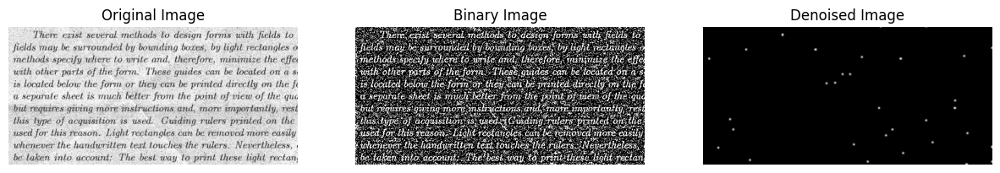

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('Images/image7.png')  # Replace with your actual image path

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding
binary_image = cv2.adaptiveThreshold(gray_image, 255,
                                     cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY_INV, 11, 2)

# Morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
clean_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

# Optionally, apply Gaussian blur
denoised_image = cv2.GaussianBlur(clean_image, (5, 5), 0)

# Result Visualization
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Binary Image')
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Denoised Image')
plt.imshow(denoised_image, cmap='gray')
plt.axis('off')
plt.show()

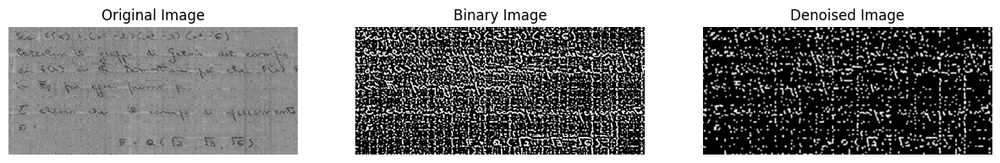

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('Images/image5.jpg')  # Replace with your actual image path

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to smooth the image before thresholding
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Apply adaptive thresholding to get a binary image
binary_image = cv2.adaptiveThreshold(blurred_image, 255,
                                     cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY_INV, 11, 2)

# Morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
clean_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
clean_image = cv2.morphologyEx(clean_image, cv2.MORPH_CLOSE, kernel)  # Close gaps

# Optionally apply further Gaussian blur to reduce noise
denoised_image = cv2.GaussianBlur(clean_image, (3, 3), 0)

# Result Visualization
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Binary Image')
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Denoised Image')
plt.imshow(denoised_image, cmap='gray')
plt.axis('off')

plt.show()


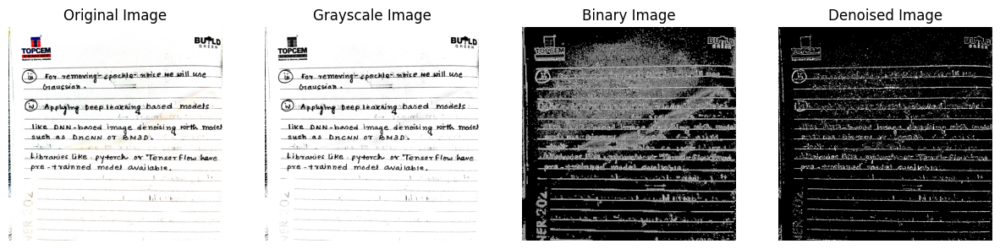

In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('Images/image11.png')  # Replace with your actual image path

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Enhance contrast using histogram equalization
equalized_image = cv2.equalizeHist(gray_image)

# Apply Gaussian blur to smooth the image before thresholding
blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

# Apply adaptive thresholding to get a binary image (Otsu's method can also be used)
binary_image = cv2.adaptiveThreshold(blurred_image, 255,
                                     cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY_INV, 11, 2)

# Morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))  # Experiment with size
clean_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
clean_image = cv2.morphologyEx(clean_image, cv2.MORPH_CLOSE, kernel)  # Close gaps

# Apply median blur to reduce noise while preserving edges
denoised_image = cv2.medianBlur(clean_image, 5)

# Result Visualization
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title('Binary Image')
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title('Denoised Image')
plt.imshow(denoised_image, cmap='gray')
plt.axis('off')

plt.show()
